In [54]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
plt.rcParams["figure.figsize"] = (12,6)


# - Defining color palette and color maps:

In [55]:
colors=["#157dd9","#302c3e","#f6f6f6"]
cmap = LinearSegmentedColormap.from_list('cmap', colors, N=22)

In [56]:
def sub_cmap(cmap, vmin, vmax):
    return lambda v: cmap(vmin + (vmax - vmin) * v)

In [57]:
cmap1 = sub_cmap(cmap, 0.5, 5)
cmap2=sub_cmap(cmap, 5, 10)

# - Data description:

Attribute Information:

scale (0:Not Applicable;1-5)

Gender: Gender of the passengers (Female, Male)

Customer Type: The customer type (Loyal customer, disloyal customer)

Age: The actual age of the passengers

Type of Travel: Purpose of the flight of the passengers (Personal Travel, Business Travel)

Class: Travel class in the plane of the passengers (Business, Eco, Eco Plus)

Flight distance: The flight distance of this journey

Inflight wifi service: Satisfaction level of the inflight wifi service 

Departure/Arrival time convenient: Satisfaction level of Departure/Arrival time convenient

Ease of Online booking: Satisfaction level of online booking

Gate location: Satisfaction level of Gate location

Food and drink: Satisfaction level of Food and drink

Online boarding: Satisfaction level of online boarding

Seat comfort: Satisfaction level of Seat comfort

Inflight entertainment: Satisfaction level of inflight entertainment

On-board service: Satisfaction level of On-board service

Leg room service: Satisfaction level of Leg room service

Baggage handling: Satisfaction level of baggage handling

Check-in service: Satisfaction level of Check-in service

Inflight service: Satisfaction level of inflight service

Cleanliness: Satisfaction level of Cleanliness

Departure Delay in Minutes: Minutes delayed when departure

Arrival Delay in Minutes: Minutes delayed when Arrival

Label:

Satisfaction: Airline satisfaction level(Satisfaction, neutral or dissatisfaction)

# - Importing and exploring data:

In [58]:
data=pd.read_csv("Invistico_Airline.csv")

In [59]:
data.columns

Index(['satisfaction', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Seat comfort',
       'Departure/Arrival time convenient', 'Food and drink', 'Gate location',
       'Inflight wifi service', 'Inflight entertainment', 'Online support',
       'Ease of Online booking', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Cleanliness', 'Online boarding',
       'Departure Delay in Minutes', 'Arrival Delay in Minutes'],
      dtype='object')

In [60]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   satisfaction                       129880 non-null  object 
 1   Gender                             129880 non-null  object 
 2   Customer Type                      129880 non-null  object 
 3   Age                                129880 non-null  int64  
 4   Type of Travel                     129880 non-null  object 
 5   Class                              129880 non-null  object 
 6   Flight Distance                    129880 non-null  int64  
 7   Seat comfort                       129880 non-null  int64  
 8   Departure/Arrival time convenient  129880 non-null  int64  
 9   Food and drink                     129880 non-null  int64  
 10  Gate location                      129880 non-null  int64  
 11  Inflight wifi service              1298

In [61]:
data.describe()

,Age,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,Gate location,Inflight wifi service,Inflight entertainment,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
count,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000
mean,39.427957,1981.409055,2.838597,2.990645,2.851994,2.990422,3.249130,3.383477,3.519703,3.472105,3.465075,3.485902,3.695673,3.340807,3.705759,3.352587,14.713713,15.091129
std,15.119360,1027.115606,1.392983,1.527224,1.443729,1.305970,1.318818,1.346059,1.306511,1.305560,1.270836,1.292226,1.156483,1.260582,1.151774,1.298715,38.071126,38.465650
min,7.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,1359.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,3.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,40.000000,1925.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,4.000000,0.000000,0.000000
75%,51.000000,2544.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,5.000000,4.000000,5.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,85.000000,6951.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


# - Visualization:

Text(0.5, 1.0, 'satisfaction')

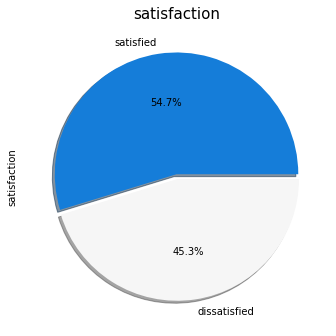

In [62]:
plt.subplot(1, 2, 2)
round(data['satisfaction'].value_counts()/data.shape[0]*100,2).plot.pie(autopct= '%1.1f%%',colormap=cmap, explode=[0.02,0.02],shadow=True)
plt.title('satisfaction', fontsize=15)

In [63]:
def visualize(c):
    x=[0.02 for i in range(len(list(data[c].unique())))] 
    plt.subplot(1, 2, 1)
    plt.title(f'{c} and satisfaction', fontsize=15)
    sns.countplot(x=c,hue='satisfaction', data=data, palette=colors)

    plt.subplot(1, 2, 2)
    round(data[c].value_counts()/data.shape[0]*100,2).plot.pie(autopct= '%1.1f%%',colormap=cmap, explode=x,shadow=True)
    plt.title(c, fontsize=15)

    plt.show()

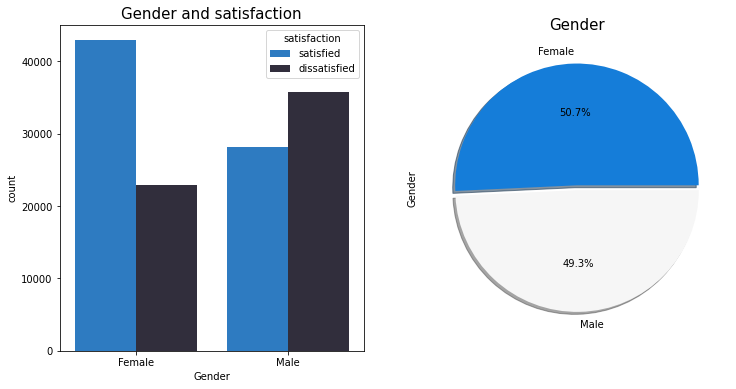

In [64]:
visualize('Gender')

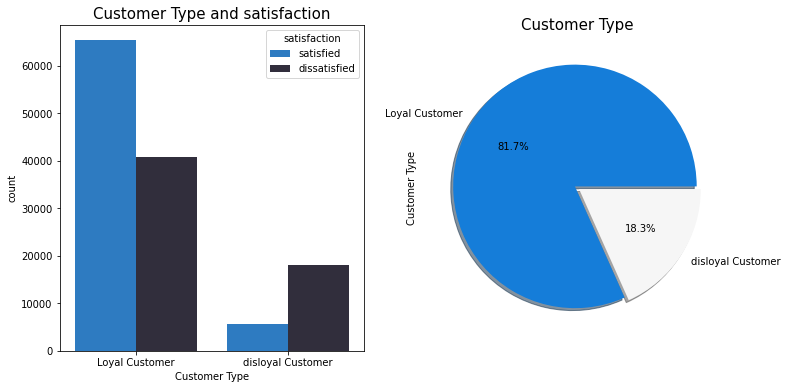

In [65]:
visualize('Customer Type')

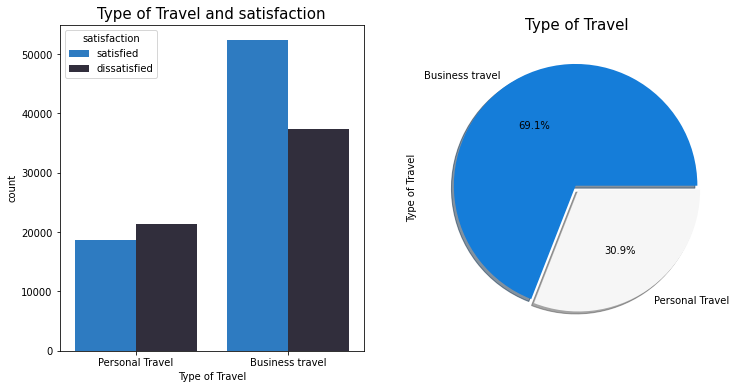

In [66]:
visualize('Type of Travel')

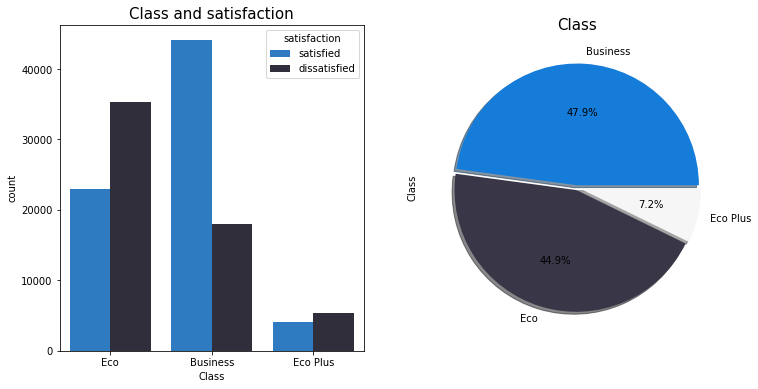

In [67]:
visualize('Class')

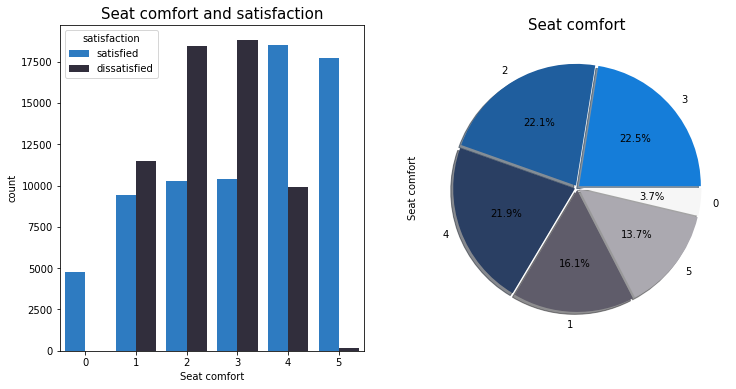

In [68]:
visualize('Seat comfort')

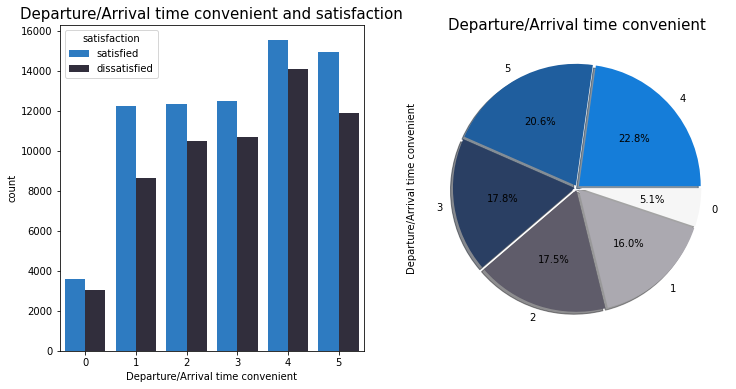

In [69]:
visualize('Departure/Arrival time convenient')

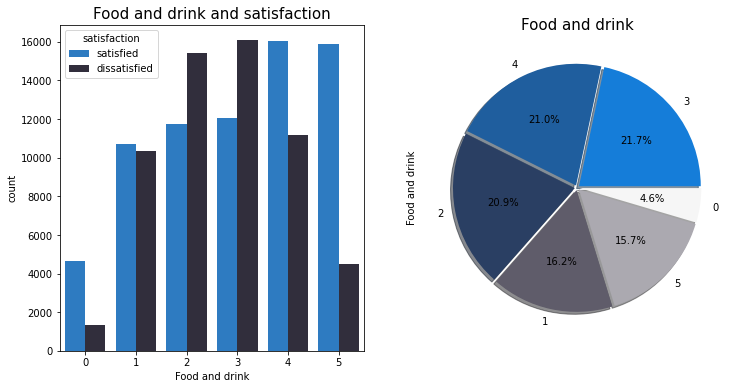

In [70]:
visualize('Food and drink')

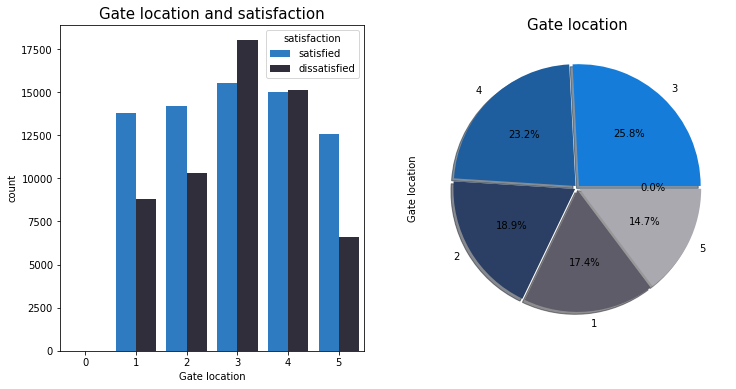

In [71]:
visualize('Gate location')

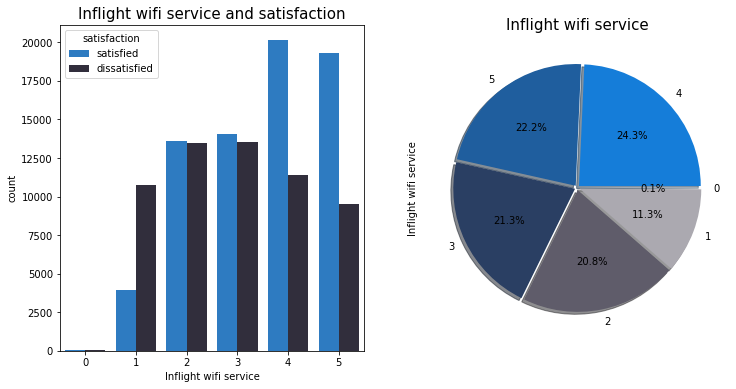

In [72]:
visualize('Inflight wifi service')

<AxesSubplot:xlabel='Flight Distance', ylabel='Count'>

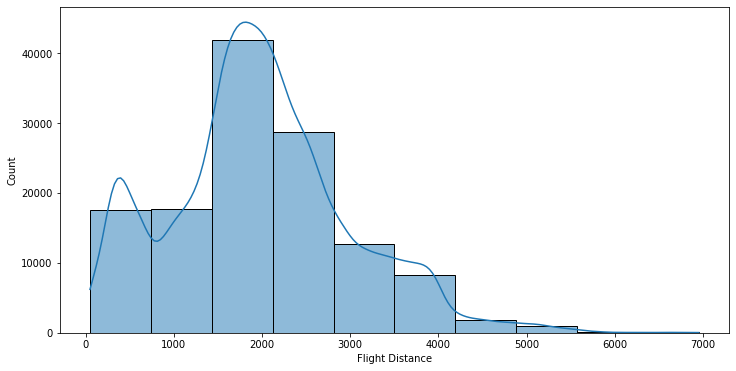

In [73]:
sns.histplot(data['Flight Distance'] , bins = 10,kde=True,palette=colors)

<AxesSubplot:xlabel='Age', ylabel='Count'>

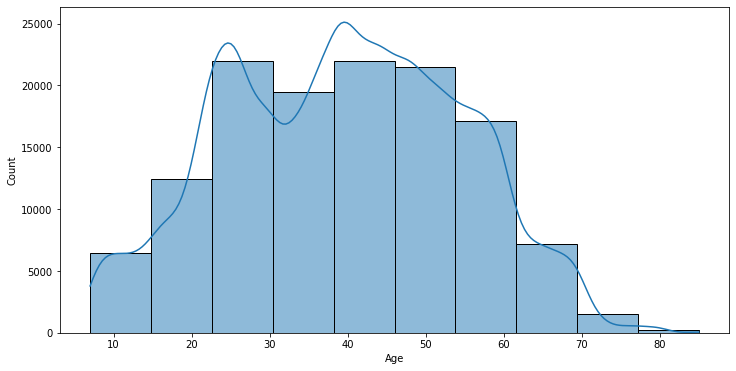

In [74]:
sns.histplot(data['Age'] , bins = 10,kde=True,palette=colors)

In [75]:
services=['Seat comfort',
       'Food and drink',
       'Inflight wifi service', 'Inflight entertainment', 'Online support',
       'Ease of Online booking', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Cleanliness', 'Online boarding',
       ]

In [76]:
others=data.drop(services,axis=1)

In [77]:
data.columns

Index(['satisfaction', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Seat comfort',
       'Departure/Arrival time convenient', 'Food and drink', 'Gate location',
       'Inflight wifi service', 'Inflight entertainment', 'Online support',
       'Ease of Online booking', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Cleanliness', 'Online boarding',
       'Departure Delay in Minutes', 'Arrival Delay in Minutes'],
      dtype='object')

In [78]:
fig = px.sunburst(data, path=['Class', 'Type of Travel'])
fig.show()

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "c:\Users\Planet_X\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\interactiveshell.py", line 3398, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\Planet_X\AppData\Local\Temp\ipykernel_17308\4256190711.py", line 1, in <cell line: 1>
    fig = px.sunburst(data, path=['Class', 'Type of Travel'])
  File "c:\Users\Planet_X\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\express\_chart_types.py", line 1541, in sunburst
    return make_figure(
  File "c:\Users\Planet_X\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\express\_core.py", line 1992, in make_figure
    args = process_dataframe_hierarchy(args)
  File "c:\Users\Planet_X\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\express\_core.py", line 1545, in process_dataframe_hierarchy
    _check_dataframe_all_leaves(df[path[::-1]])
  File "c:\Users\Planet_X\AppData\Local\Programs\Python\Pyt

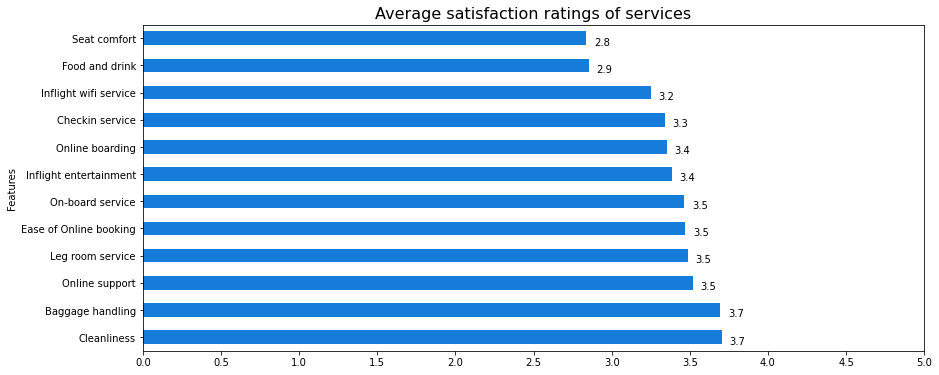

In [ ]:
total = float(len(data))
ax = data[services].mean().sort_values(ascending=False).plot(kind="barh",ylabel="Features",xticks=[0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5],figsize=(14,6),colormap=cmap)
plt.title('Average satisfaction ratings of services', fontsize=16)
for p in ax.patches:
    count = '{:.1f}'.format(p.get_width())
    x, y = p.get_x() + p.get_width()+0.15, p.get_y()
    ax.annotate(count, (x, y), ha='right')
plt.show()

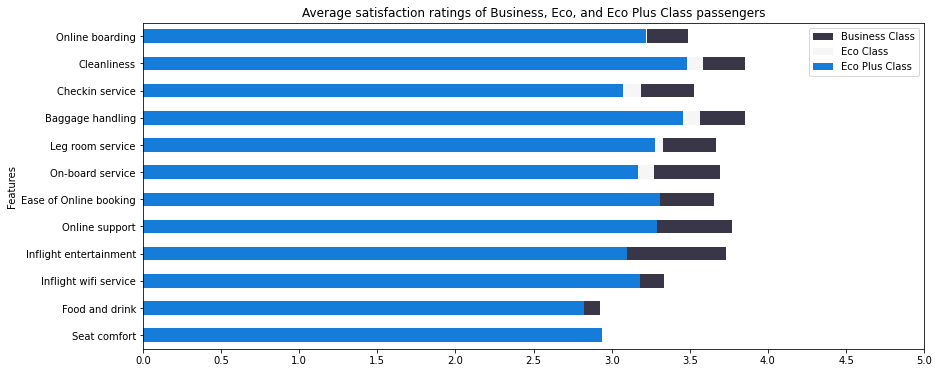

In [ ]:
data[data["Class"]=="Business"].drop(others,axis=1).mean().plot(kind="barh",legend=True,ylabel="Features",colormap=cmap1,figsize=(14,6),label="Business Class",title="Average satisfaction ratings of Business, Eco, and Eco Plus Class passengers")
data[data["Class"]=="Eco"].drop(others,axis=1).mean().plot(kind="barh",legend=True,label="Eco Class",colormap=cmap2,xticks=[0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5])
data[data["Class"]=="Eco Plus"].drop(others,axis=1).mean().plot(kind="barh",legend=True,label="Eco Plus Class",colormap=cmap,xticks=[0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5])
plt.show()

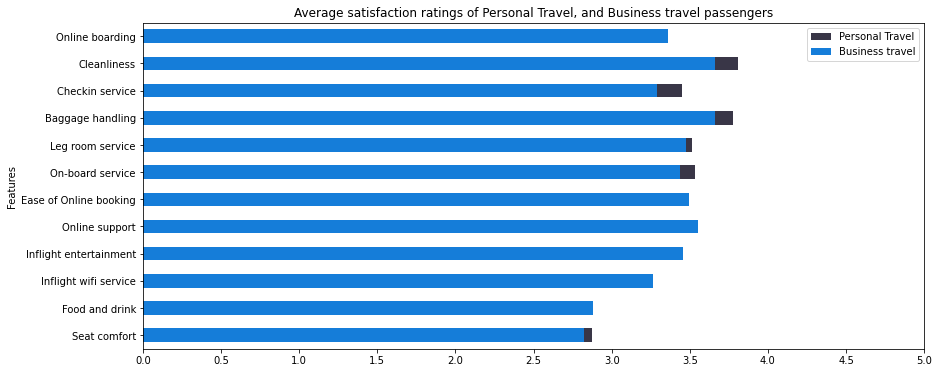

In [ ]:
data[data["Type of Travel"]=="Personal Travel"].drop(others,axis=1).mean().plot(kind="barh",legend=True,ylabel="Features",colormap=cmap1,figsize=(14,6),label="Personal Travel",title="Average satisfaction ratings of Personal Travel, and Business travel passengers")
data[data["Type of Travel"]=="Business travel"].drop(others,axis=1).mean().plot(kind="barh",legend=True,label="Business travel",colormap=cmap,xticks=[0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5])
plt.show()

Text(0.5, 1.0, 'Distribution of Inflight entertainment')

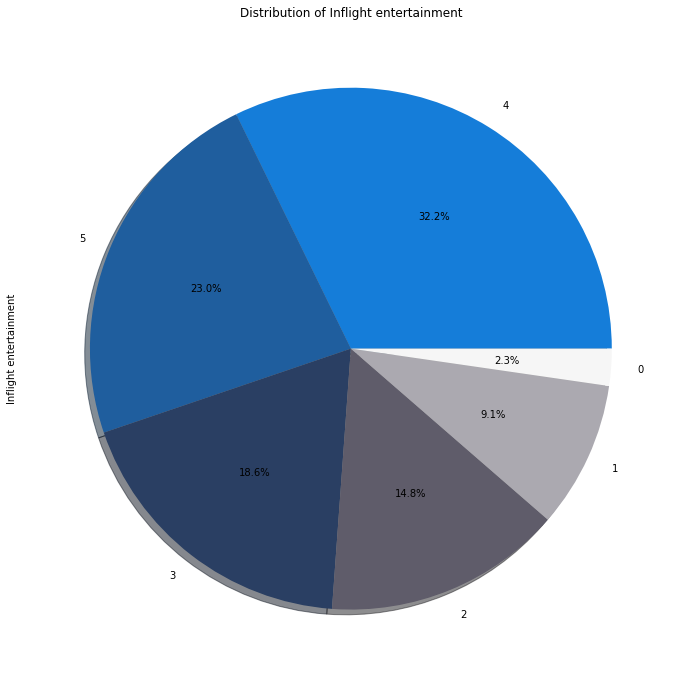

In [ ]:
fig, ax = plt.subplots(figsize = (12, 12))
round(data['Inflight entertainment'].value_counts()/data.shape[0]*100,2).plot.pie(autopct= '%1.1f%%',colormap=cmap,shadow=True)
plt.title('Distribution of Inflight entertainment')

Text(0.5, 1.0, 'Relation between satisfaction and Inflight entertainment')

<Figure size 1440x720 with 0 Axes>

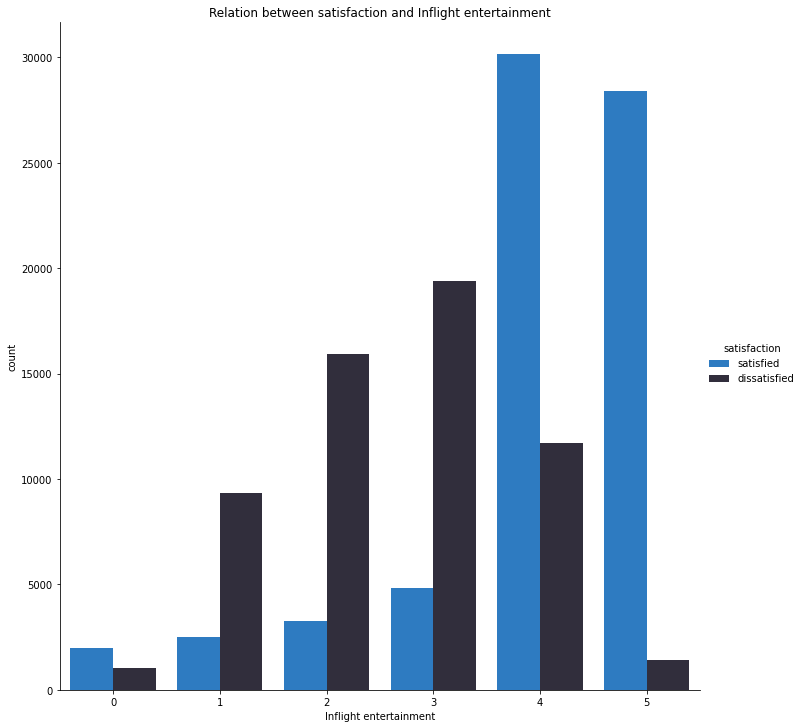

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="Inflight entertainment", hue="satisfaction",height=10,palette=colors)
plt.title('Relation between satisfaction and Inflight entertainment')

when the Inflight entertainment is high passengers have high satisfaction

Text(0.5, 1.0, 'Distribution of Online support')

<Figure size 1440x720 with 0 Axes>

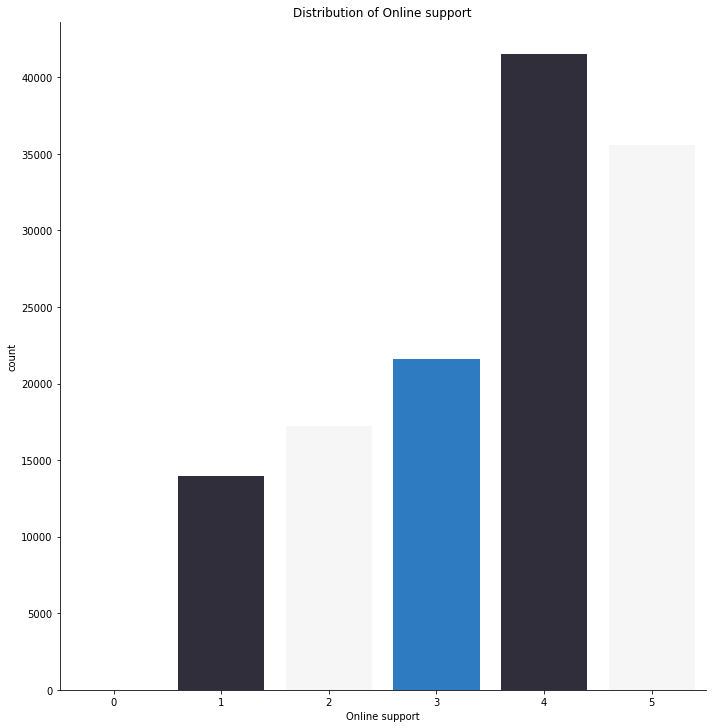

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="Online support",height=10,palette=colors)
plt.title('Distribution of Online support')

Text(0.5, 1.0, 'Relation between satisfaction and Online support')

<Figure size 1440x720 with 0 Axes>

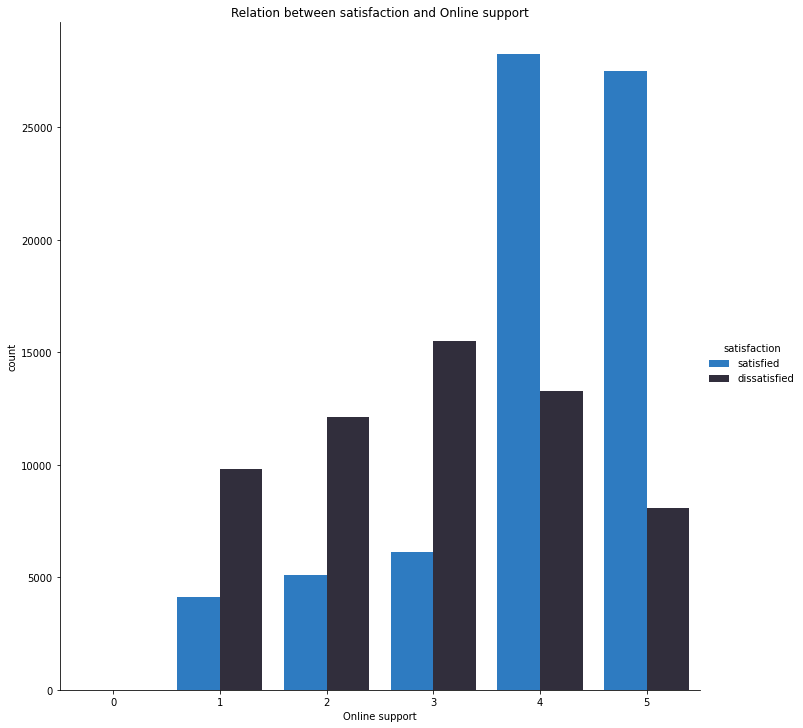

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="Online support", hue="satisfaction",height=10,palette=colors)
plt.title('Relation between satisfaction and Online support')

when the rate of Online support is high the passengers have high satisfaction

Text(0.5, 1.0, 'Distribution of Ease of Online booking')

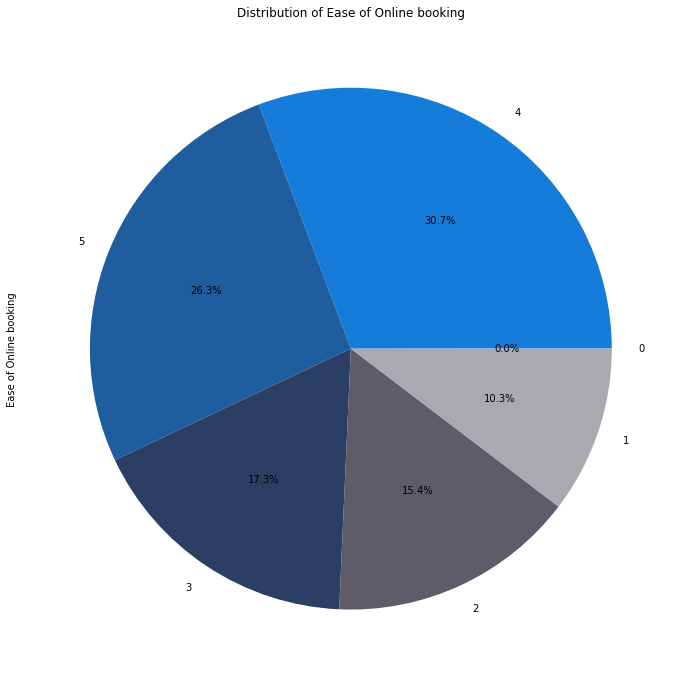

In [ ]:
fig, ax = plt.subplots(figsize = (12, 12))
round(data['Ease of Online booking'].value_counts()/data.shape[0]*100,2).plot.pie(autopct= '%1.1f%%',colormap=cmap)
plt.title('Distribution of Ease of Online booking')

Text(0.5, 1.0, 'Relation between satisfaction and Ease of Online booking')

<Figure size 1440x720 with 0 Axes>

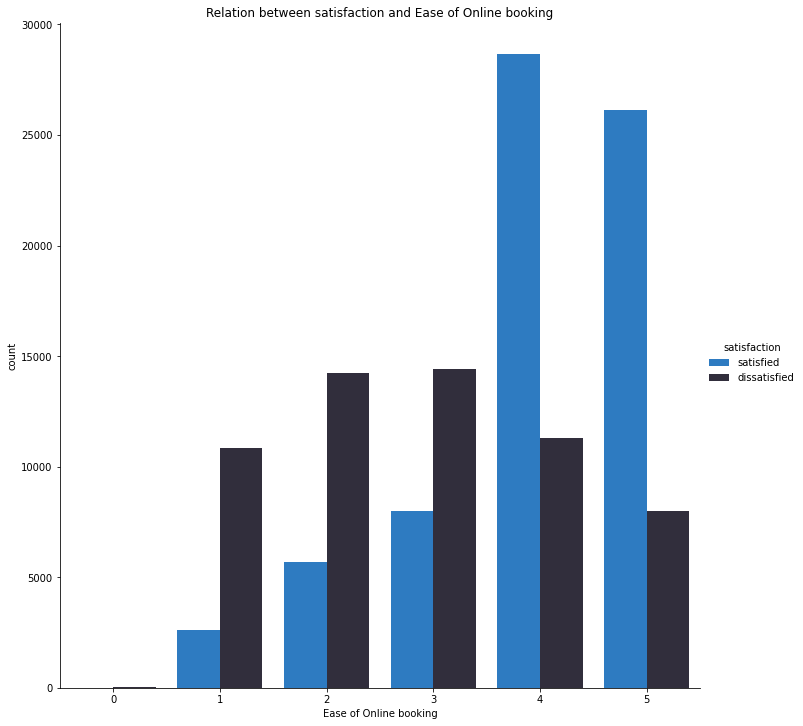

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="Ease of Online booking", hue="satisfaction",height=10,palette=colors)
plt.title('Relation between satisfaction and Ease of Online booking')

When the rate of Ease of Online booking is high passengers have high satisfaction

Text(0.5, 1.0, 'Distribution of On-board service')

<Figure size 1440x720 with 0 Axes>

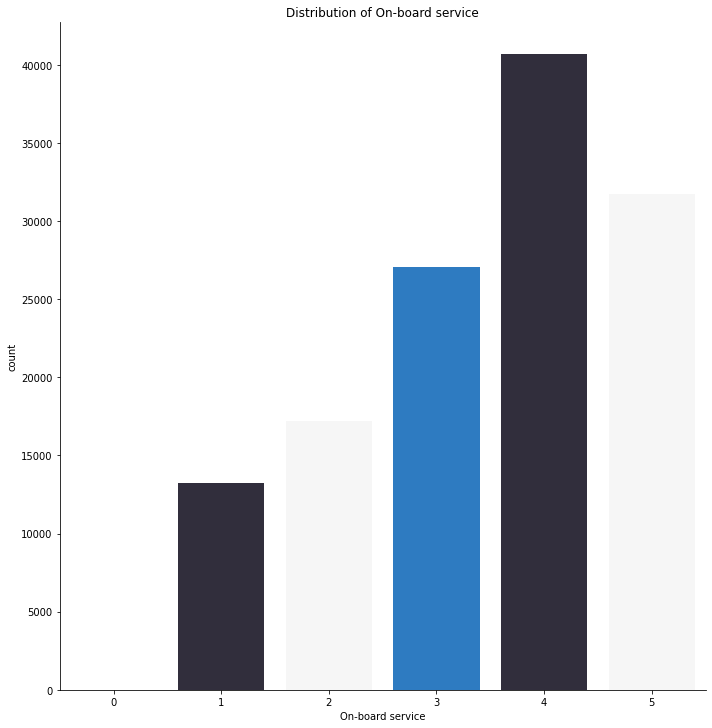

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="On-board service",height=10,palette=colors)
plt.title('Distribution of On-board service')

Text(0.5, 1.0, 'Relation between satisfaction and On-board service')

<Figure size 1440x720 with 0 Axes>

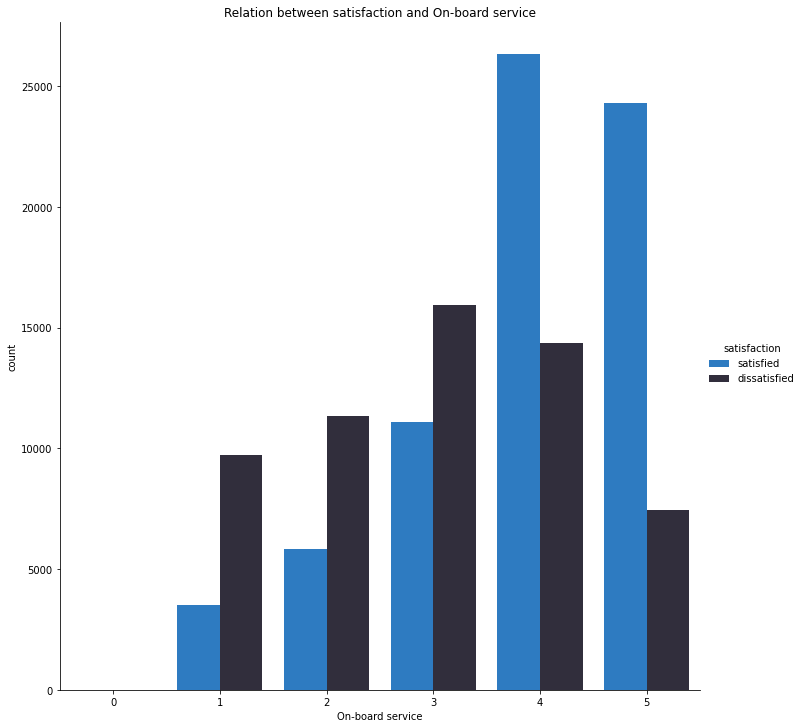

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="On-board service", hue="satisfaction",height=10,palette=colors)
plt.title('Relation between satisfaction and On-board service')

When the rate of Ease of On-board service is high passengers have high satisfaction

# Leg room service

Text(0.5, 1.0, 'Distribution of Leg room service')

<Figure size 1440x720 with 0 Axes>

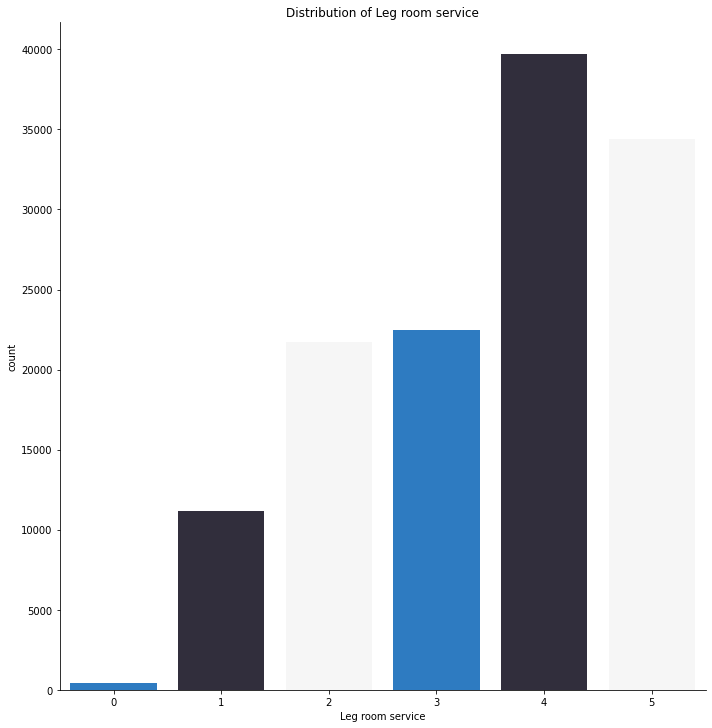

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="Leg room service",height=10,palette=colors)
plt.title('Distribution of Leg room service')

Text(0.5, 1.0, 'Relation between satisfaction and Leg room service')

<Figure size 1440x720 with 0 Axes>

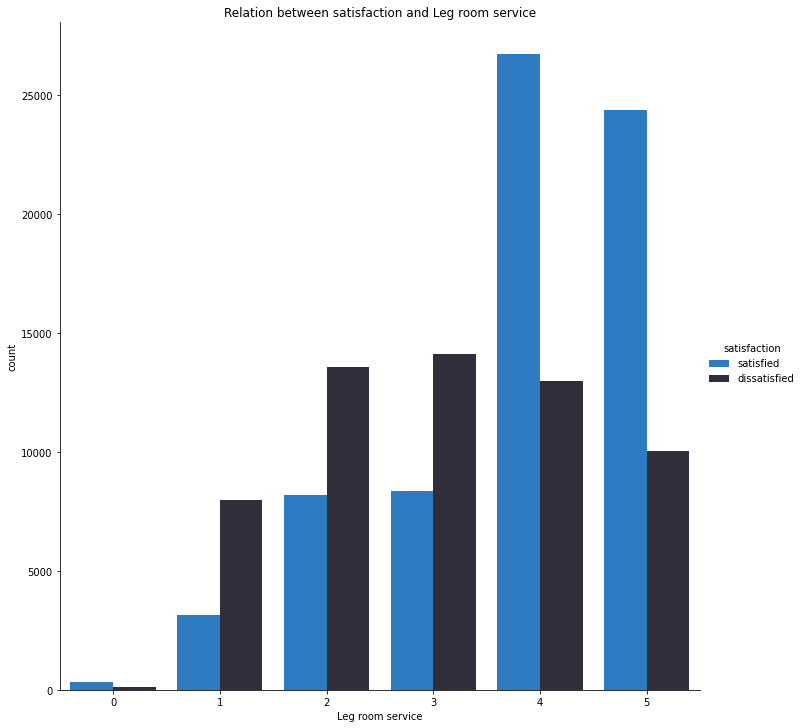

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="Leg room service", hue="satisfaction",height=10,palette=colors)
plt.title('Relation between satisfaction and Leg room service')

When the rate of Ease of Leg room service is high passengers have high satisfaction

Text(0.5, 1.0, 'Distribution of Baggage handling rate')

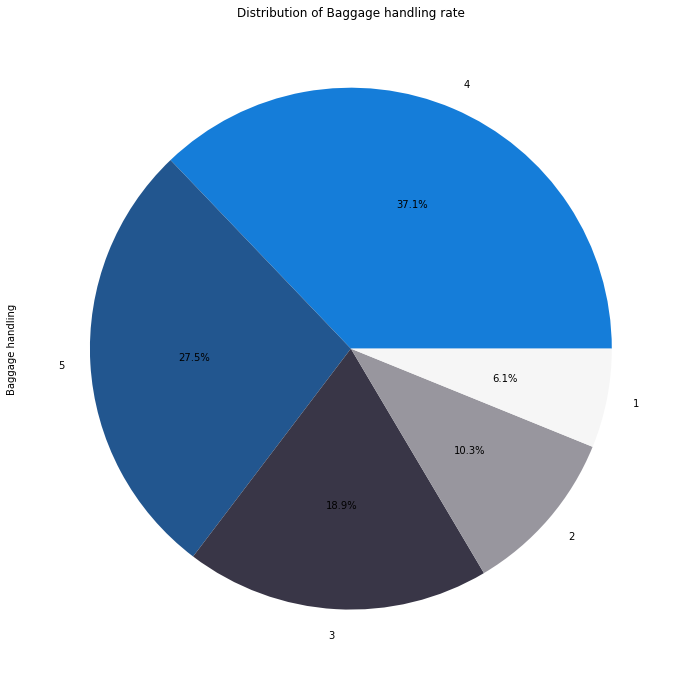

In [ ]:
fig, ax = plt.subplots(figsize = (12, 12))
round(data['Baggage handling'].value_counts()/data.shape[0]*100,2).plot.pie(autopct= '%1.1f%%',colormap=cmap)
plt.title('Distribution of Baggage handling rate')

Text(0.5, 1.0, 'Relation between satisfaction and Baggage handling')

<Figure size 1440x720 with 0 Axes>

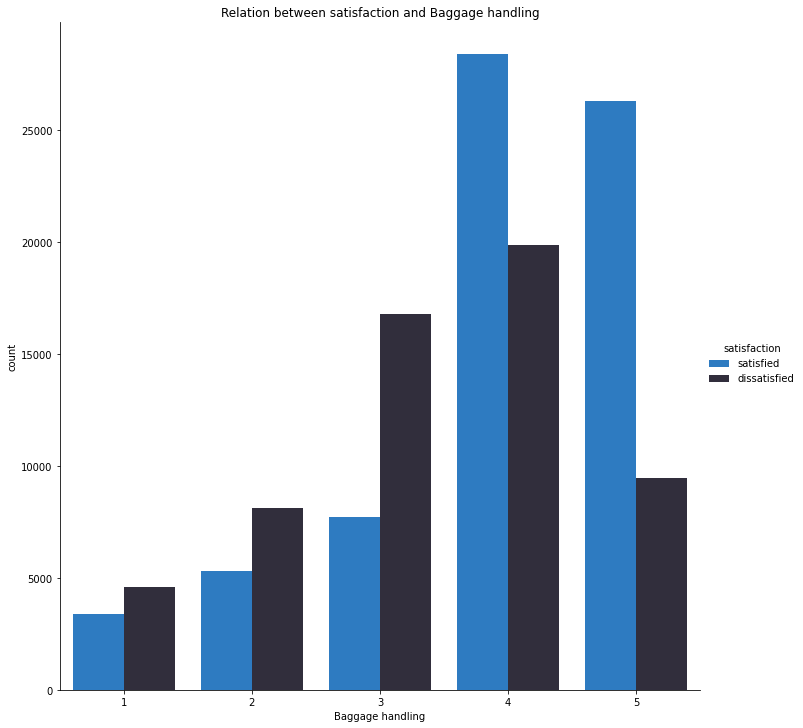

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="Baggage handling", hue="satisfaction",height=10,palette=colors)
plt.title('Relation between satisfaction and Baggage handling')

When the rate of Baggage handling is high passengers have high satisfaction

Text(0.5, 1.0, 'Distribution of Checkin service')

<Figure size 1440x720 with 0 Axes>

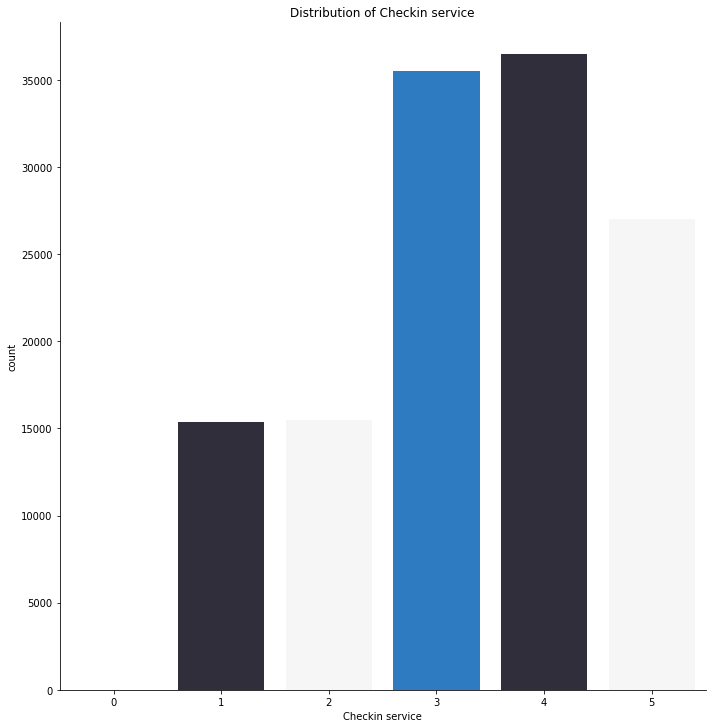

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="Checkin service",height=10,palette=colors)
plt.title('Distribution of Checkin service')

Text(0.5, 1.0, 'Relation between satisfaction and Checkin service')

<Figure size 1440x720 with 0 Axes>

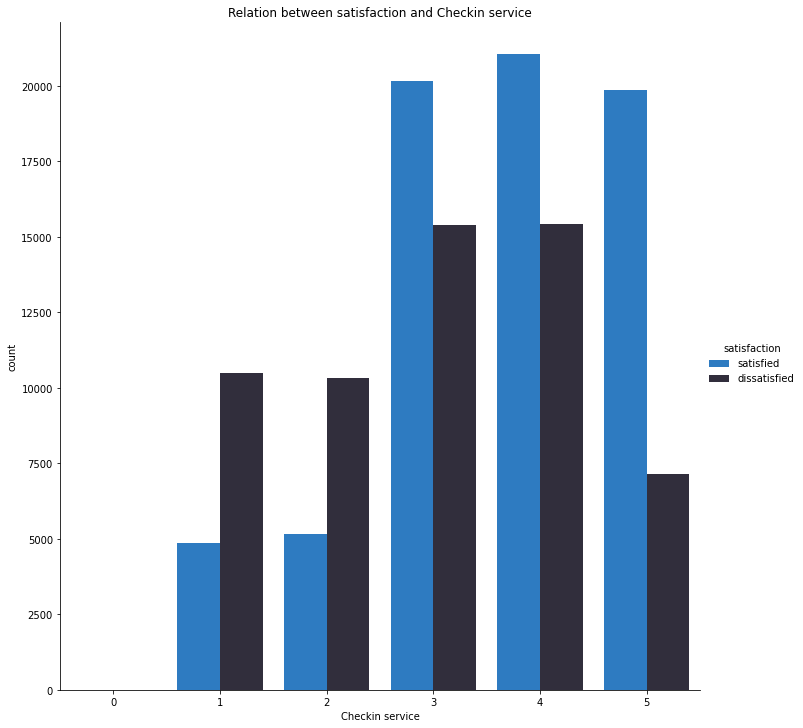

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="Checkin service", hue="satisfaction",height=10,palette=colors)
plt.title('Relation between satisfaction and Checkin service')

When the rate of Baggage handling is high passengers have high satisfaction

Text(0.5, 1.0, 'Distribution of Cleanliness rate')

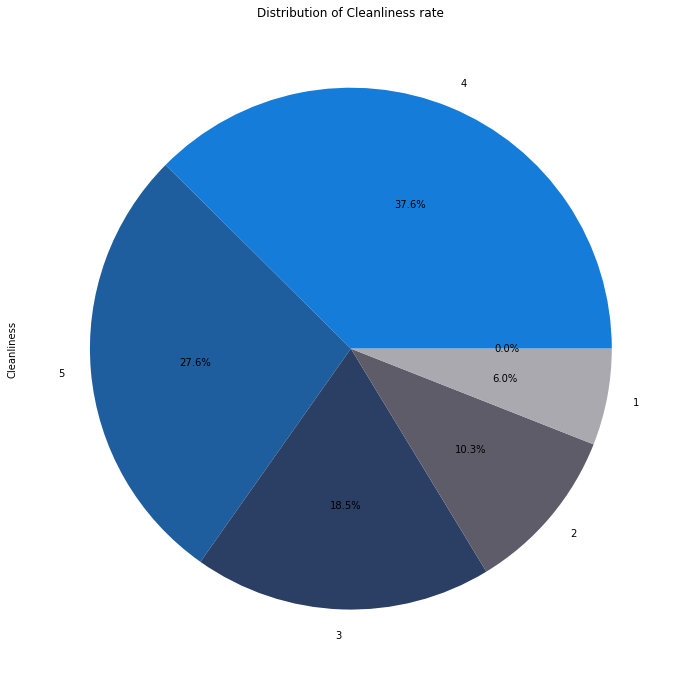

In [ ]:
fig, ax = plt.subplots(figsize = (12, 12))
round(data['Cleanliness'].value_counts()/data.shape[0]*100,2).plot.pie(autopct= '%1.1f%%',colormap=cmap)
plt.title('Distribution of Cleanliness rate')

Text(0.5, 1.0, 'Relation between satisfaction and Cleanliness')

<Figure size 1440x720 with 0 Axes>

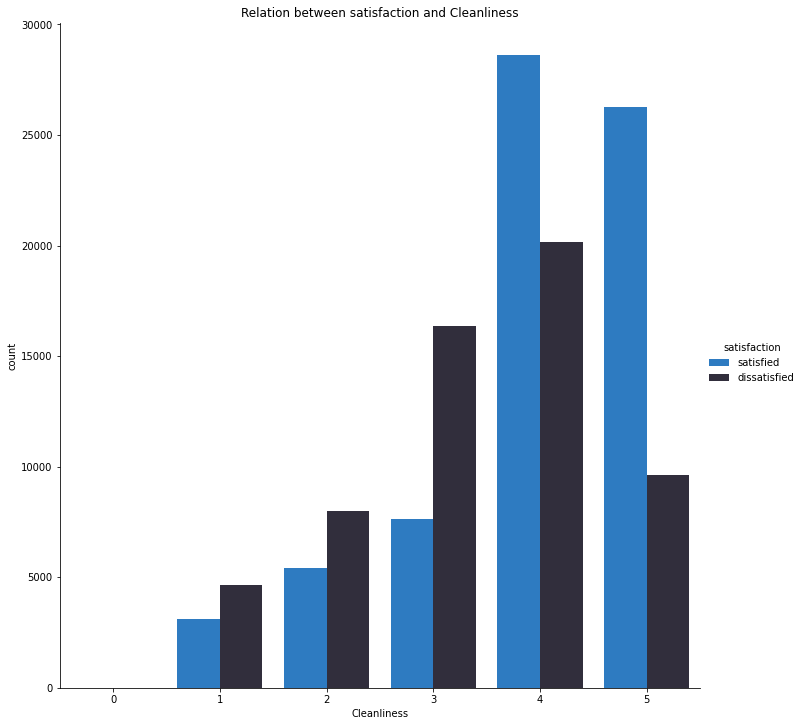

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="Cleanliness", hue="satisfaction",height=10,palette=colors)
plt.title('Relation between satisfaction and Cleanliness')

When the rate of Cleanliness is high passengers have high satisfaction

Text(0.5, 1.0, 'Distribution of Online boarding')

<Figure size 1440x720 with 0 Axes>

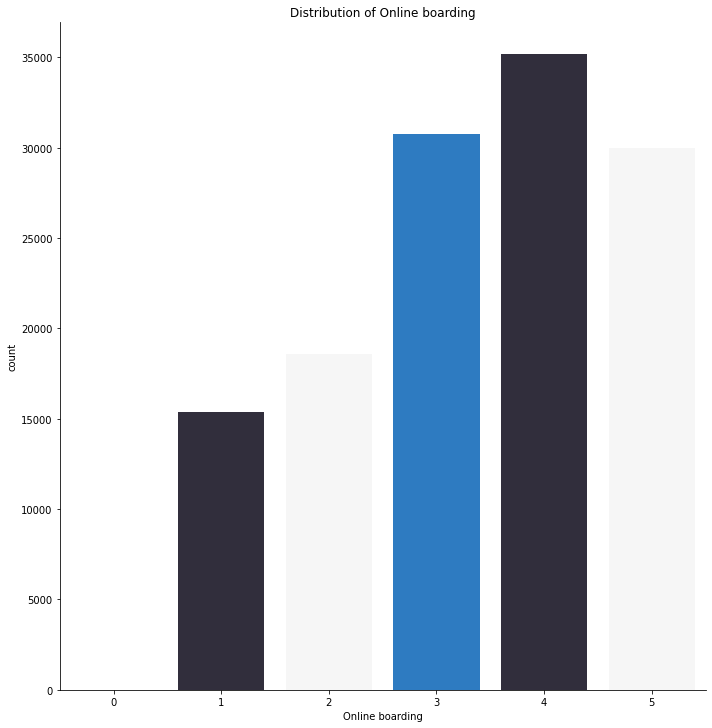

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="Online boarding",height=10,palette=colors)
plt.title('Distribution of Online boarding')

Text(0.5, 1.0, 'Relation between satisfaction and Online boarding')

<Figure size 1440x720 with 0 Axes>

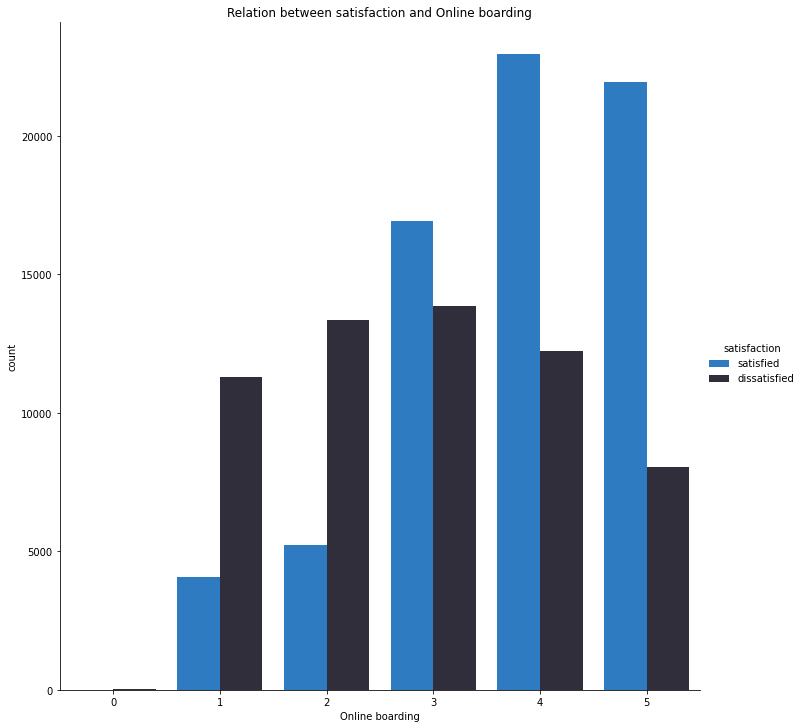

In [ ]:
plt.figure(figsize = (20,10))
sns.catplot(data=data, kind="count", x="Online boarding", hue="satisfaction",height=10,palette=colors)
plt.title('Relation between satisfaction and Online boarding')

When the rate of Online boarding is high passengers have high satisfaction

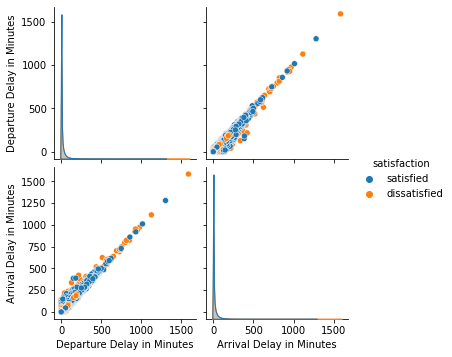

In [ ]:
numerics=['Departure Delay in Minutes', 'Arrival Delay in Minutes']
sns.pairplot(data[[*numerics,"satisfaction"]],hue="satisfaction")
plt.show()

In [ ]:
fig = px.sunburst(data, path=['satisfaction', 'Type of Travel', 'Gender'])
fig.show()

In [ ]:
fig = px.scatter(data, x='Seat comfort',y='Flight Distance', title='Relation between Seat comfort and the Distance')
fig.show()

In [ ]:
fig = px.sunburst(data, path=['Baggage handling', 'Gender'],title='Gender and Baggage handling rate')
fig.show()

In [ ]:
fig = px.scatter(data, x='Type of Travel', y='Departure Delay in Minutes', title='Type of Travel and Departure Delay in Minutes ')
fig.show()

In [ ]:
fig = px.scatter(data, x='Type of Travel', y='Arrival Delay in Minutes', title='Type of Travel and Arrival Delay in Minutes')
fig.show()

KeyboardInterrupt: 

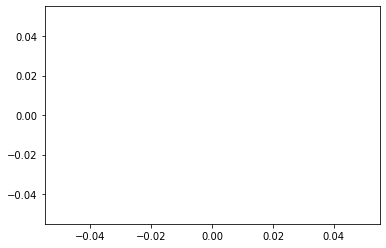

In [ ]:
services= ['Inflight wifi service', 'Inflight entertainment', 'Online support',
       'Ease of Online booking', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Cleanliness', 'Online boarding']
for service in services:
       sns.lineplot(data=data,x='Age',y=service,)
       plt.show()

<AxesSubplot:>

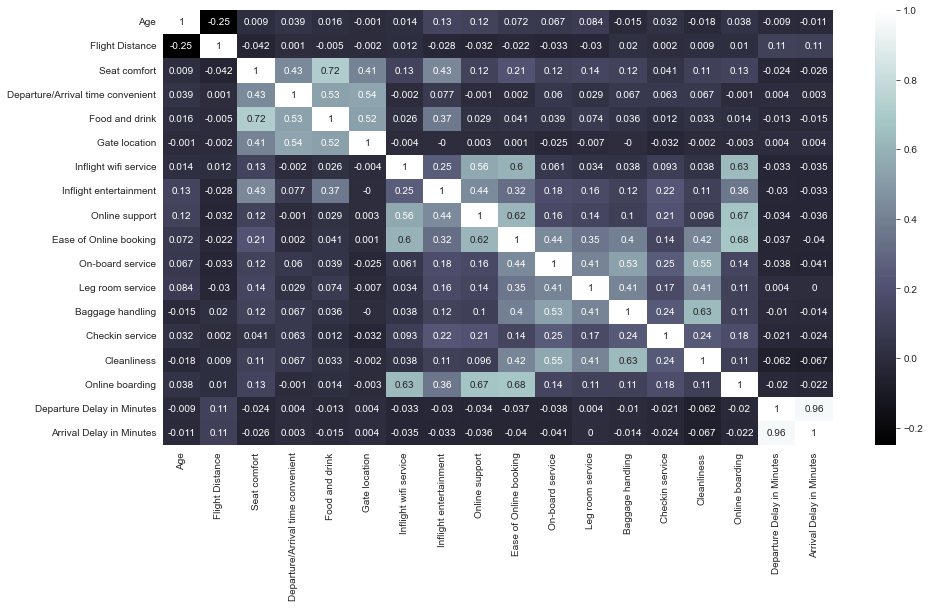

In [ ]:
plt.figure(figsize=(15,8))
sns.heatmap(round(data.corr(),3), annot = True,cmap = cmap,)

In [ ]:
data["AgesRange"]=pd.cut(data["Age"],bins=[0,20,40,60,100],right=False)

<AxesSubplot:xlabel='AgesRange', ylabel='count'>

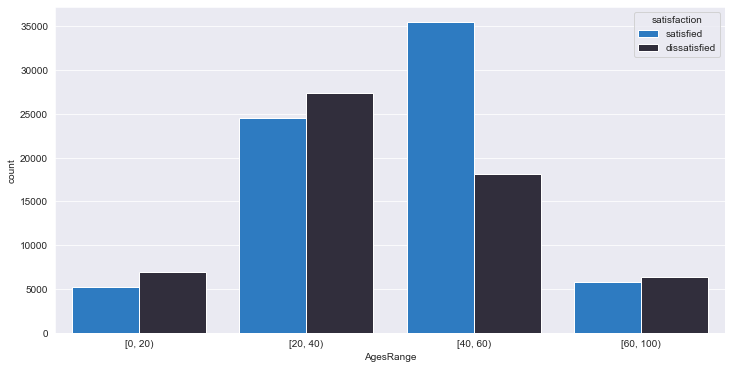

In [ ]:
sns.countplot(x ='AgesRange', data= data, hue= 'satisfaction',palette=colors)

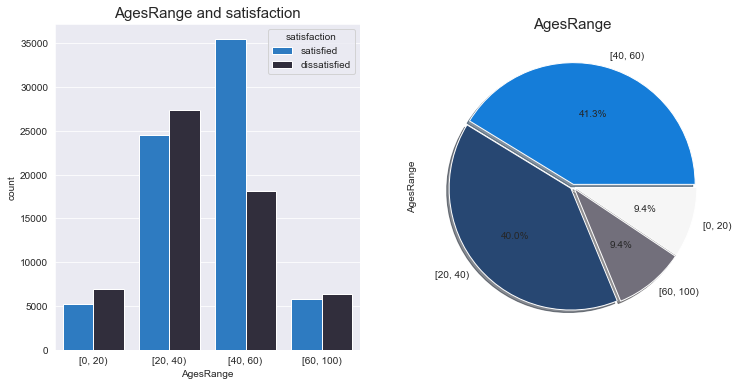

In [ ]:
visualize('AgesRange')